# Análisis Semántico

Top2Vec es un algoritmo para el modelamiento de topicos y búsqueda semántica. Este automaticamente detecta topicos presentes en el texto permite ver conceptos cercanos.

In [4]:
import pandas as pd
import re
from top2vec import Top2Vec

/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
2024-04-03 22:32:59.601043: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-03 22:33:05.815115: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [6]:
#print(Top2Vec.__doc__)

Los documentos se encuentran en formato .txt y separados por parrafos. En total hay 1310 párrafos.

In [7]:
def documentos(input):
    with open(input, 'r') as file:
        content = file.read()
    return content.split("\n")

docs = documentos("documentos.txt") 
len(docs)

1310

Ajuste de parámetros para la creación del modelo.

In [32]:
umap_args = {'n_neighbors': 7,
             'n_components': 3,
             'metric': 'cosine',
             "random_state": 15}

hdbscan_args = {'min_cluster_size': 7,
                'min_samples':3,
                'metric': 'euclidean',
                'cluster_selection_method': 'eom'}

In [33]:
model = Top2Vec(docs, 
                speed = "deep-learn", #fast-learn, deep-learn
                min_count = 4, 
                ngram_vocab = True,
                workers = 8,
                umap_args = umap_args,
                hdbscan_args = hdbscan_args,
                #embedding_model = "universal-sentence-encoder-multilingual-large",
                #split_documents = True,
               )

2024-04-03 22:45:15,621 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training
2024-04-03 22:45:16,722 - top2vec - INFO - Downloading universal-sentence-encoder-multilingual model
INFO:top2vec:Downloading universal-sentence-encoder-multilingual model
2024-04-03 22:45:20,389 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2024-04-03 22:45:48,277 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2024-04-03 22:45:56,905 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2024-04-03 22:45:56,990 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


Se lograron extraer 48 topicos distintos y un vocabulario de 1-gramas y 2-gramas de 3277 palabras.

In [34]:
print(len(model.vocab), model.get_num_topics())

3277 48


In [44]:
bigrams = []
for word in model.vocab:
    if len(word.split()) == 2:
        bigrams.append(word)
print(len(bigrams))
bigrams[10:20]

587


['las formas',
 'el mercado',
 'las relaciones',
 'economia popular',
 'derechos laborales',
 'sin patron',
 'los ultimos',
 'nuevas formas',
 'la economia',
 'en numeros']

Podemos tambien ver los algunos de los tópicos y las palabras relevantes/relacionadas/cercanas.

In [36]:
topic_words, word_scores, topic_nums = model.get_topics(num_topics = 10)
print(topic_words, topic_nums)

[['de' 'pues' 'le' 'del' 'the' 'la' 'da' 'an' 'un' 'al' 'van' 'tal' 'of'
  'do' 'dos' 'les' 'given' 'respecto' 'it' 'as' 'el' 'that' 'que' 'se'
  'its' 'tion' 'on' 'los' 'so' 'at' 'una' 'tra' 'por' 'alla' 'para' 'ha'
  'ello' 'su' 'namely' 'thus' 've' 'is' 'to' 'en' 'per' 'decir' 'ii'
  'hacia' 'he' 'po']
 ['employment level' 'ingreso promedio' 'empleados' 'unions' 'equation'
  'salarios' 'trabajadores' 'salarial' 'bajos ingresos' 'wages'
  'empresarial capitalista' 'empleo' 'economics' 'economistas'
  'economia capitalista' 'los trabajadores' 'incumbent workers'
  'employment' 'empleos' 'socioeconomic' 'del ingreso'
  'baja productividad' 'remuneraciones' 'empleabilidad' 'workers are'
  'labour force' 'remuneracion' 'ingreso' 'empresas capitalistas'
  'salario' 'les trabajadores' 'marginal' 'worker' 'per worker' 'income'
  'produccion distribucion' 'workers' 'capitalist firm' 'trabajador'
  'inequality' 'socioeconomicas' 'trabajadores cuenta'
  'trabajadores familiares' 'workforce' 'w

Procedemos a generar nubes de palabras para identificar las palabras clave de cada tópico. 

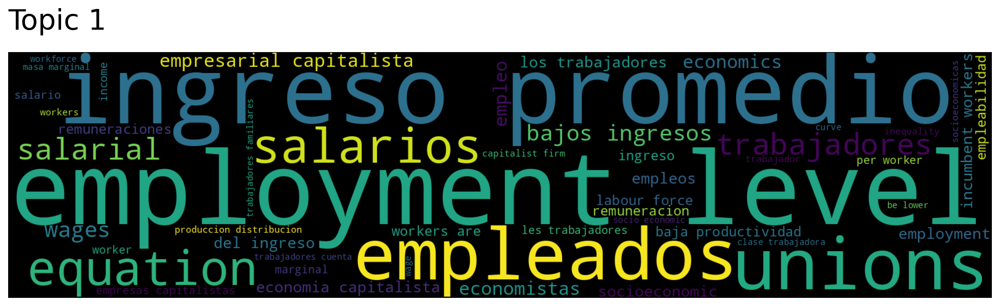

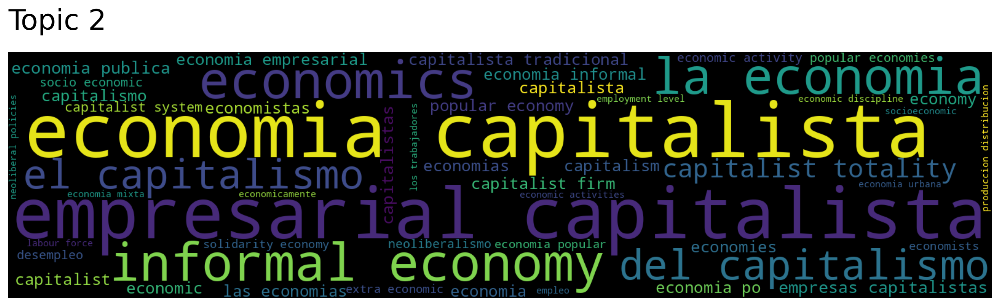

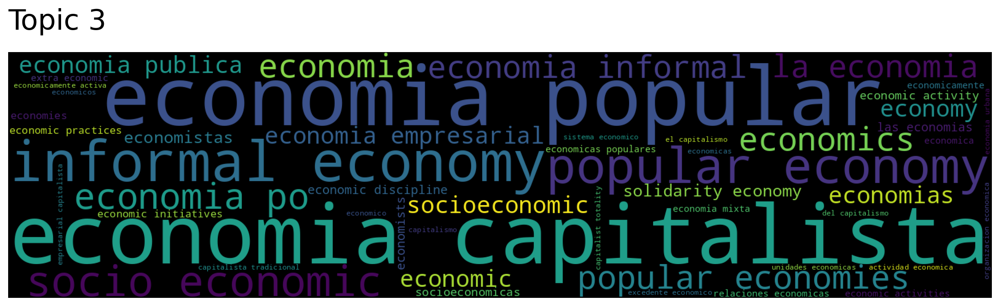

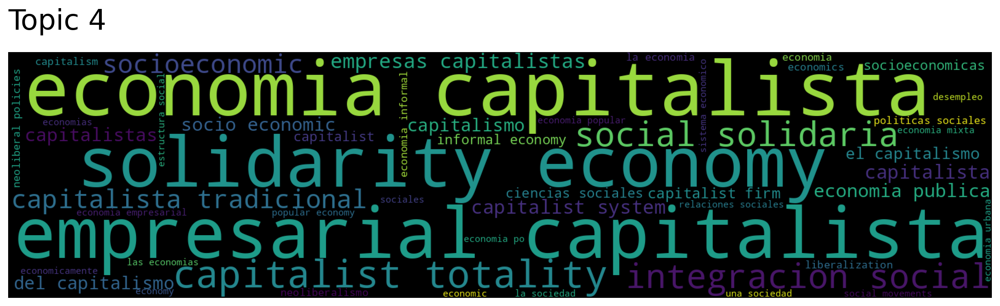

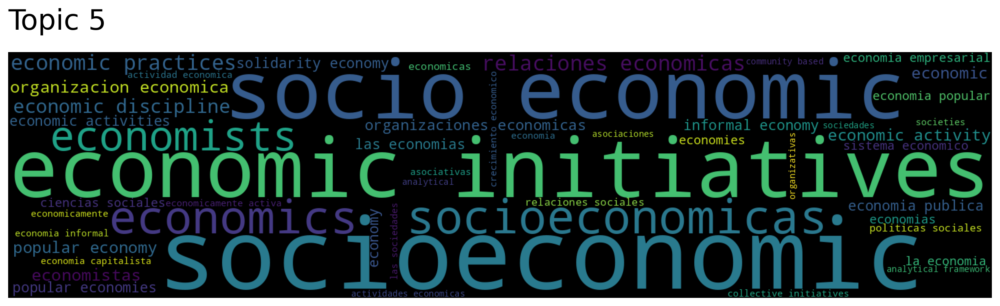

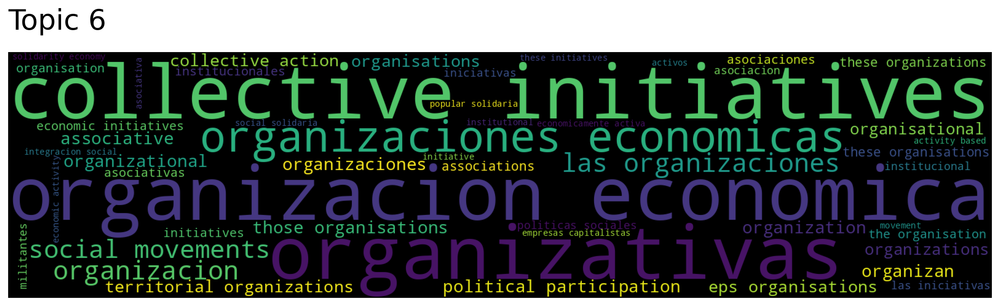

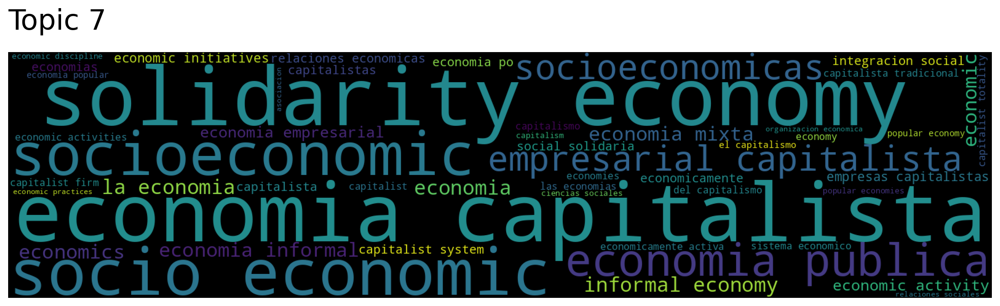

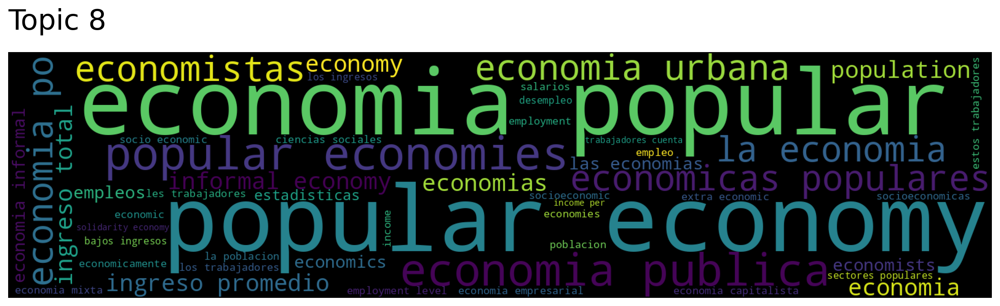

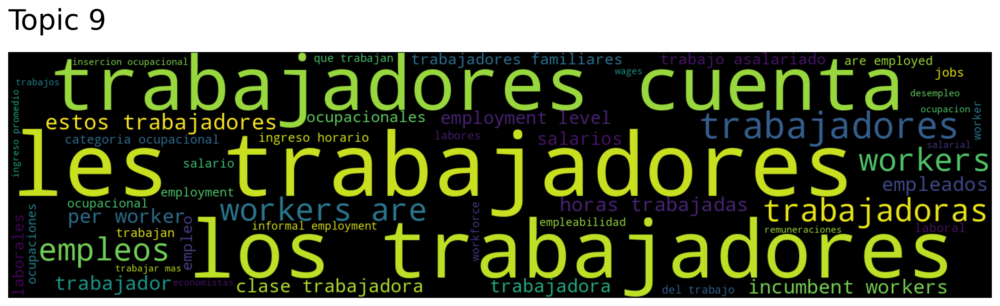

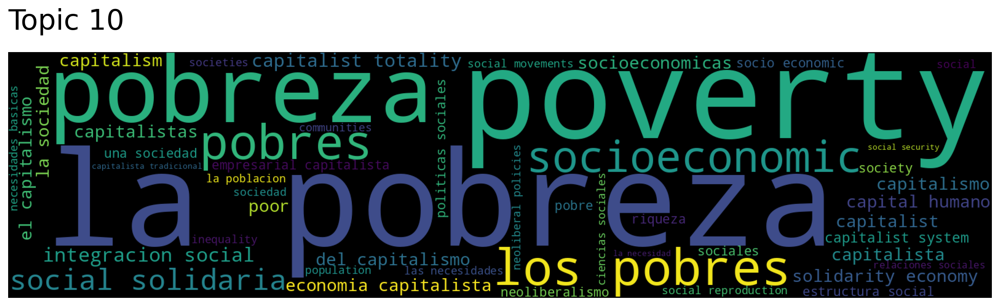

In [41]:
for topic in [1,2, 3, 4, 5, 6, 7, 8, 9, 10]:
    model.generate_topic_wordcloud(topic)

Adicionalmente podemos generar nubes de palabras relacionadas con palabras identificadas en el vocabulario. En este caso particular podemos buscar los 5 tópicos mas relevantes/cercanos a las palabras "solidaridad y vida".

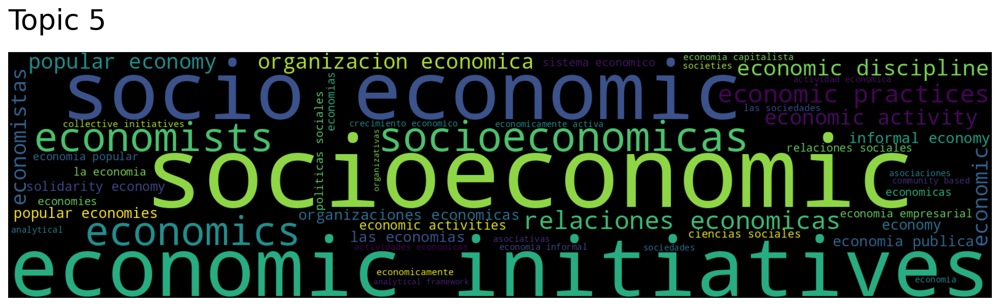

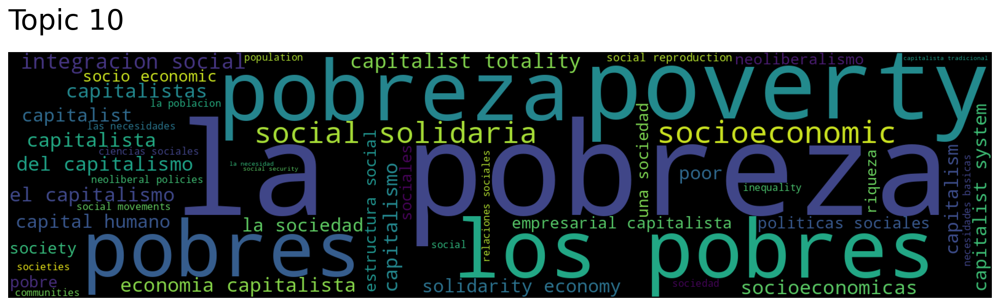

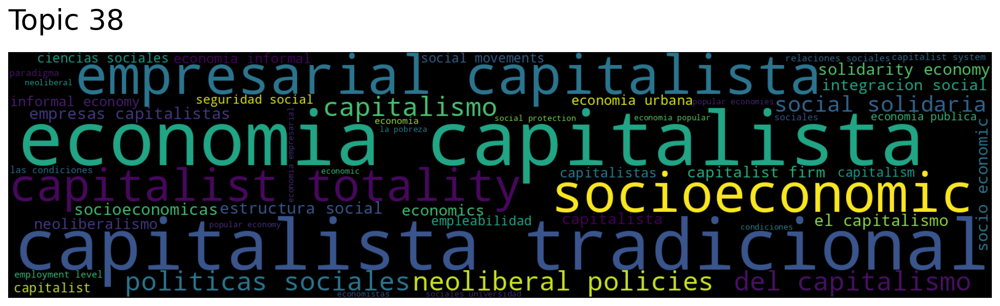

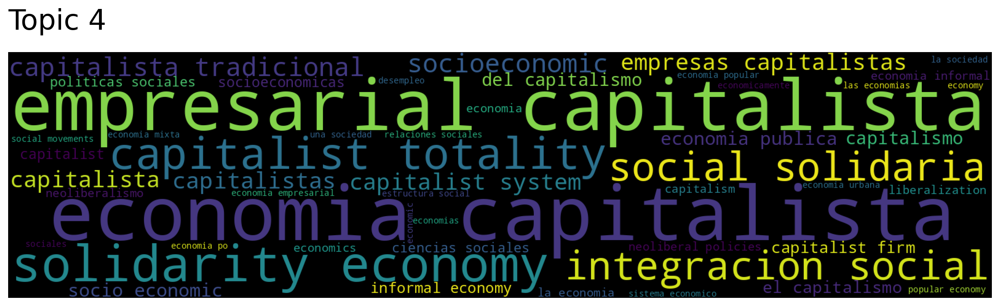

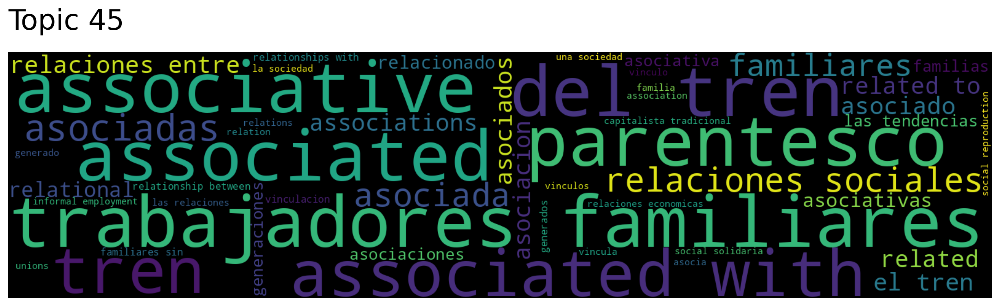

In [45]:
topic_words, word_scores, topic_scores, topic_nums = model.search_topics(keywords=["solidaridad", "vida"], num_topics=6)
for topic in topic_nums:
    if topic != 0:
        model.generate_topic_wordcloud(topic)